In [1]:
from google.colab import drive
drive.mount('/content/gdrive')



Mounted at /content/gdrive


In [ ]:
!unzip -qq "/content/gdrive/My Drive/Tede/data.zip"

In [3]:
pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 433.8/433.8 kB 5.2 MB/s eta 0:00:00


In [6]:
################################################ ΠΡΟΕΠΕΞΕΡΓΑΣΙΑ ΔΕΔΟΜΕΝΩΝ ##############################################################

# Εγω ειχα τον φακελο data (unzipped) στο myDrive μου στο μονοπατι που φαινεται στην αρχικη γραμμη. Αλλαξτε το αναλογως με το που το εχετε εσεις.
# Αποφασισαμε να επεξεργαστουμε τα δεδομενα με τον εξης τροπο: οποια δεδομενα μπορουσαμε να τα αντικαταστησουμε με την μεση τιμη της στηλης, το καναμε.
# Στα υπολοιπα οπως αλφαριθμητικα δεδομενα, ημερομηνιες κλπ, καναμε drop τις γραμμες.

# Ονοματα:
# Νικολαος Μιχαλουτσος
# Ανδρεας Κοκκορας

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import seaborn as sns
import folium
import sys
import os

# Λίστα με τους κύριους φακέλους για τα έτη 2019 και 2023
main_folder_2019 = "/content/gdrive/My Drive/Tede/data/2019"
main_folder_2023 = "/content/gdrive/My Drive/Tede/data/2023"
main_folders = [main_folder_2019, main_folder_2023]

required_columns_2019 = ['id', 'zipcode', 'transit', 'bedrooms', 'beds', 'review_scores_rating', 'number_of_reviews',
                    'neighbourhood', 'name', 'latitude', 'longitude', 'last_review', 'instant_bookable', 'host_id',
                    'host_since', 'host_response_rate', 'host_identity_verified', 'host_has_profile_pic',
                    'first_review', 'description', 'city', 'cancellation_policy', 'bed_type', 'bathrooms',
                    'accommodates', 'amenities', 'room_type', 'property_type', 'price', 'availability_365',
                    'minimum_nights']

required_columns_2023 = ['id', 'bedrooms', 'beds', 'review_scores_rating', 'number_of_reviews', 'host_id',
                    'neighbourhood_cleansed', 'name', 'latitude', 'longitude', 'last_review', 'instant_bookable',
                    'host_since', 'host_response_rate', 'host_identity_verified', 'host_has_profile_pic',
                    'first_review', 'description', 'bathrooms', 'accommodates', 'amenities', 'room_type',
                    'property_type', 'price', 'availability_365', 'minimum_nights']

required_columns = [required_columns_2019, required_columns_2023]

# Λίστα για τα αρχεία CSV που χρειαζόμαστε
files_2019 = []
files_2023 = []

# Λίστα για τα αρχεία CSV των αξιολογήσεων για το ερωτημα 1.10
reviews_files_2019 = []
reviews_files_2023 = []

# Λίστες για την αποθήκευση των δεδομένων ανά έτος
dataframes_2019 = []
dataframes_2023 = []

for year in main_folders:
    # Επιλογή των υποφακέλων
    subfolders = [f for f in os.listdir(year) if os.path.isdir(os.path.join(year, f)) and f != "desktop.ini"]

    # Εξερεύνηση των υποφακέλων και εύρεση των αρχείων CSV listings.csv
    for folder in subfolders:
        folder_path = os.path.join(year, folder)
        file_path = os.path.join(folder_path, "listings.csv")
        reviews_path = os.path.join(folder_path, "reviews.csv")
        if os.path.exists(file_path):
            if year == main_folder_2019:
                files_2019.append(file_path)
            else:
                files_2023.append(file_path)
        if os.path.exists(reviews_path):
            if year == main_folder_2019:
                reviews_files_2019.append(reviews_path)
            else:
                reviews_files_2023.append(reviews_path)

    if year == main_folder_2019:
      for folder, file in zip(subfolders, files_2019):
        df = pd.read_csv(file)[required_columns_2019].assign(month=folder)
        dataframes_2019.append(df)
    else:
      for folder, file in zip(subfolders, files_2023):
        df = pd.read_csv(file)[required_columns_2023].assign(month=folder)
        dataframes_2023.append(df)

# Συνένωση των DataFrame ανά έτος
df_2019 = pd.concat(dataframes_2019, ignore_index=True)
df_2023 = pd.concat(dataframes_2023, ignore_index=True)

# Μετονομασία της στήλης neighbourhood_cleansed σε neighbourhood
df_2023.rename(columns={'neighbourhood_cleansed': 'neighbourhood'}, inplace=True)


reviews2019_list = []
reviews2023_list = []

for file in reviews_files_2019:
  reviews2019_list.append(pd.read_csv(file, nrows=2500)['comments'])

for file in reviews_files_2023:
  reviews2023_list.append(pd.read_csv(file, nrows=3000)['comments'])

reviews2019 = pd.concat(reviews2019_list, ignore_index=True)
reviews2023 = pd.concat(reviews2023_list, ignore_index=True)

# Αποθήκευση σε αρχείο CSV
df_2019.to_csv('train_2019.csv', index=False)

# Αποθήκευση σε αρχείο CSV
df_2023.to_csv('train_2023.csv', index=False)

print("Οι νέοι φάκελοι CSV δημιουργήθηκαν επιτυχώς.")

concated_2019 = pd.read_csv('train_2019.csv')
concated_2023 = pd.read_csv('train_2023.csv')

alpharithmetic_columns_2019 = ['transit', 'neighbourhood', 'name', 'last_review', 'instant_bookable',
                    'host_response_rate', 'host_identity_verified', 'host_has_profile_pic', 'host_since',
                    'first_review', 'description', 'city', 'cancellation_policy', 'bed_type', 'host_id',
                    'amenities', 'room_type', 'property_type']

alpharithmetic_columns_2023 = ['neighbourhood', 'name', 'last_review', 'instant_bookable', 'host_since',
                    'host_response_rate', 'host_identity_verified', 'host_has_profile_pic', 'host_id',
                    'first_review', 'description', 'amenities', 'room_type', 'property_type']

concated = [concated_2019, concated_2023]

required_columns_2023.remove('neighbourhood_cleansed')
required_columns_2023.append('neighbourhood')

for conc_csv, required_columns_of_year in zip(concated, required_columns):
  for column in required_columns_of_year:
    if conc_csv[column].isnull().all():
      # Αφαιρούμε τη στήλη από το DataFrame
      conc_csv.drop(column, axis=1, inplace=True)
  conc_csv['price'] = conc_csv['price'].str.replace('$', '')
  conc_csv['price'] = conc_csv['price'].str.replace(',', '')

concated_2019 = concated_2019.dropna(subset=alpharithmetic_columns_2019)
concated_2023 = concated_2023.dropna(subset=alpharithmetic_columns_2023)

data_to_fix_2019 = list(set(required_columns_2019) - set(alpharithmetic_columns_2019))

data_to_fix_2019.remove('id')
data_to_fix_2019.remove('review_scores_rating')
data_to_fix_2019.remove('number_of_reviews')
data_to_fix_2019.remove('zipcode')

for column in data_to_fix_2019:
  concated_2019 = concated_2019.copy()
  concated_2019[column] = concated_2019[column].astype(float)
  mean_value = concated_2019[column].mean()
  if column not in ['longitude', 'latitude', 'bathrooms']:
    mean_value = mean_value.round()

  concated_2019[column].fillna(mean_value, inplace=True)
  threshold = 3 * mean_value
  outliers = concated_2019[abs(concated_2019[column] - mean_value) > threshold]
  # Αντικατάσταση των ακραίων τιμών με τον μέσο όρο
  concated_2019.loc[abs(concated_2019[column] - mean_value) > threshold, column] = mean_value

mean_rating = concated_2019['review_scores_rating'].mean()
mean_rating = mean_rating.round()
mask = (concated_2019['review_scores_rating'].isnull()) & (concated_2019['number_of_reviews'] != 0)
concated_2019.loc[mask, 'review_scores_rating'] = mean_rating

data_to_fix_2023 = list(set(required_columns_2023) - set(alpharithmetic_columns_2023))

data_to_fix_2023.remove('id')
data_to_fix_2023.remove('bathrooms')
data_to_fix_2023.remove('review_scores_rating')
data_to_fix_2023.remove('number_of_reviews')

for column in data_to_fix_2023:
  concated_2023 = concated_2023.copy()
  concated_2023[column] = concated_2023[column].astype(float)
  mean_value = concated_2023[column].mean()
  if column not in ['longitude', 'latitude']:
    mean_value = mean_value.round()

  concated_2023[column].fillna(mean_value, inplace=True)
  threshold = 3 * mean_value
  # Αντικατάσταση των ακραίων τιμών με τον μέσο όρο
  concated_2023.loc[abs(concated_2023[column] - mean_value) > threshold, column] = mean_value

mean_rating = concated_2023['review_scores_rating'].mean()
mean_rating = mean_rating.round()
mask = (concated_2023['review_scores_rating'].isnull()) & (concated_2023['number_of_reviews'] != 0)
concated_2023.loc[mask, 'review_scores_rating'] = mean_rating

concated_2019.to_csv('concated2019.csv', index=False)
concated_2023.to_csv('concated2023.csv', index=False)

reviews2019 = reviews2019.dropna()

reviews2023 = reviews2023.dropna()

reviews2019.to_csv('reviews2019.csv', index=False)
reviews2023.to_csv('reviews2023.csv', index=False)


<ipython-input-6-026583578169>:72: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)[required_columns_2019].assign(month=folder)
<ipython-input-6-026583578169>:72: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)[required_columns_2019].assign(month=folder)
<ipython-input-6-026583578169>:72: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)[required_columns_2019].assign(month=folder)


Οι νέοι φάκελοι CSV δημιουργήθηκαν επιτυχώς.


1.1:


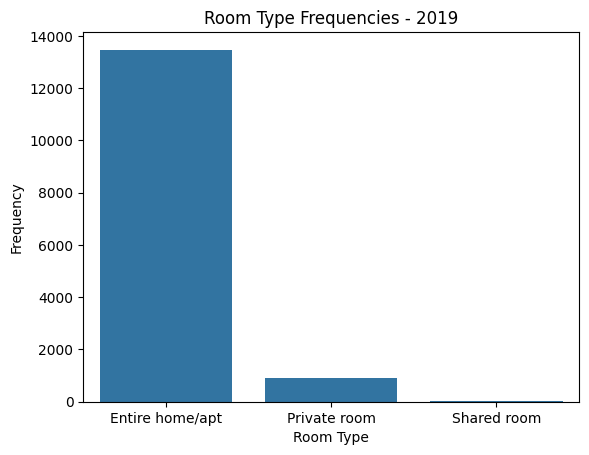

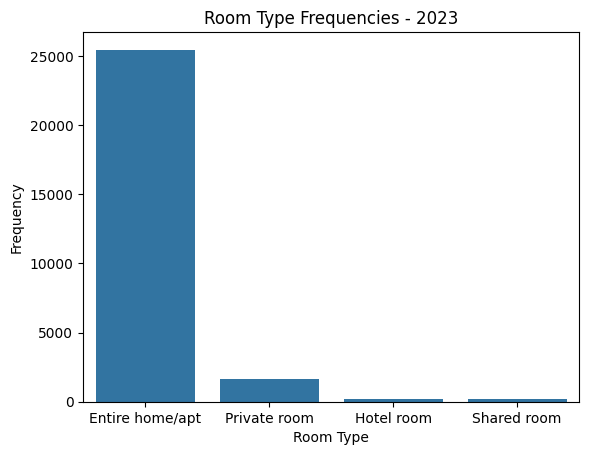

1.2:


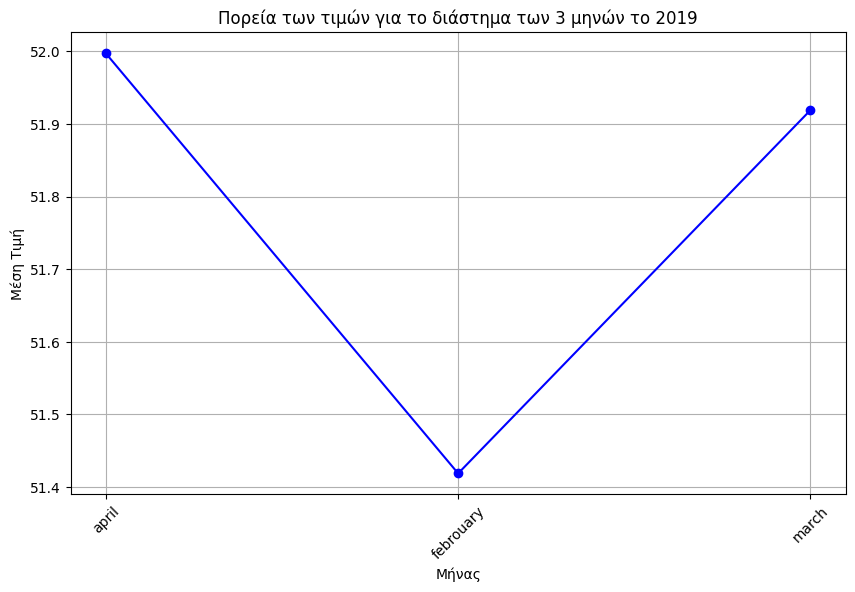

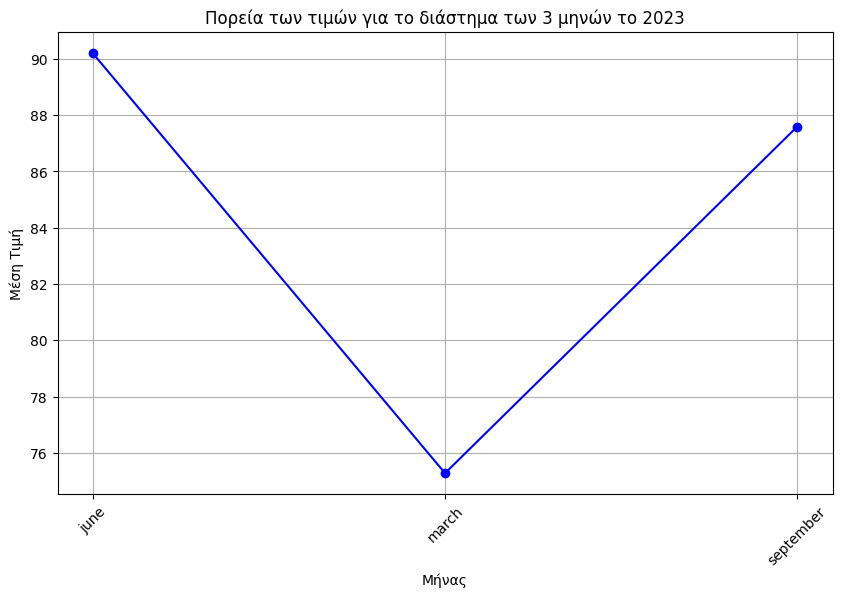

1.3:
Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές για το έτος 2019:
neighbourhood
Plaka           109849
Koukaki          75085
Neos Kosmos      66949
Psyri            44222
Metaxourgeio     34034
Name: number_of_reviews, dtype: int64
Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές για το έτος 2023:
neighbourhood
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ              420201
ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ                 193910
ΝΕΟΣ ΚΟΣΜΟΣ                         120292
ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ             98289
ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ     96376
Name: number_of_reviews, dtype: int64

1.4:
Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων για το έτος 2019 είναι:
Plaka
με συνολικό αριθμό καταχωρήσεων: 1833

Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων για το έτος 2023 είναι:
ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ
με συνολικό αριθμό καταχωρήσεων: 5393

1.5:


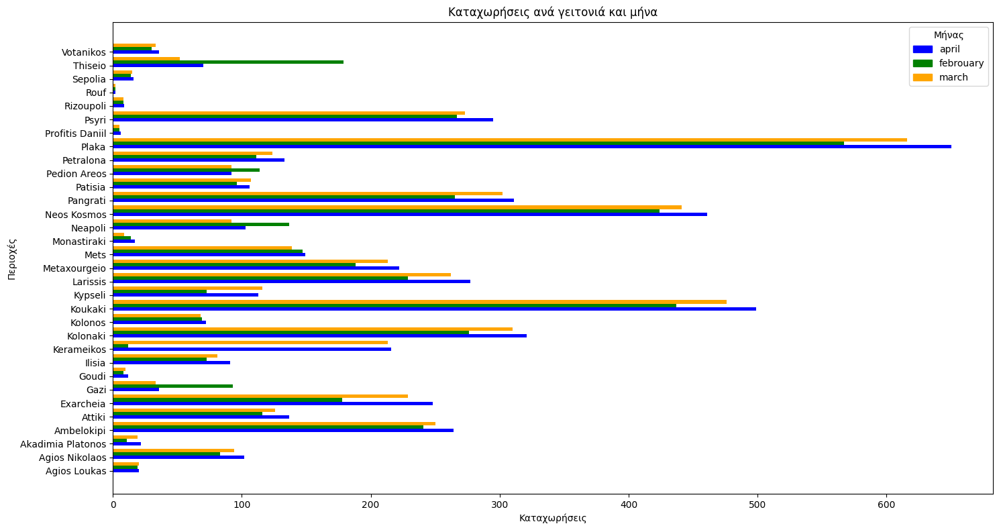

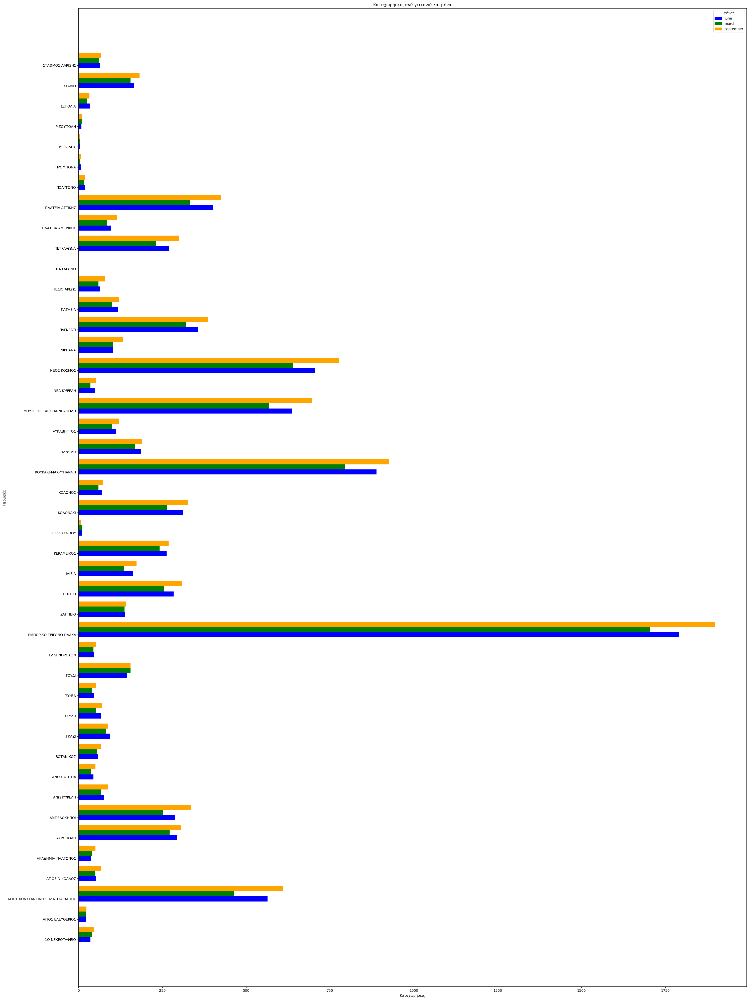

1.7:
Οι πιο συχνοί τύποι δωματίων σε κάθε γειτονιά το έτος 2019:
neighbourhood
Agios Loukas         Entire home/apt
Agios Nikolaos       Entire home/apt
Akadimia Platonos    Entire home/apt
Ambelokipi           Entire home/apt
Attiki               Entire home/apt
Exarcheia            Entire home/apt
Gazi                 Entire home/apt
Goudi                Entire home/apt
Ilisia               Entire home/apt
Kerameikos           Entire home/apt
Kolonaki             Entire home/apt
Kolonos              Entire home/apt
Koukaki              Entire home/apt
Kypseli              Entire home/apt
Larissis             Entire home/apt
Metaxourgeio         Entire home/apt
Mets                 Entire home/apt
Monastiraki          Entire home/apt
Neapoli              Entire home/apt
Neos Kosmos          Entire home/apt
Pangrati             Entire home/apt
Patisia              Entire home/apt
Pedion Areos         Entire home/apt
Petralona            Entire home/apt
Plaka                Entire home/


1.10:
Τα wordclouds του έτους 2019:


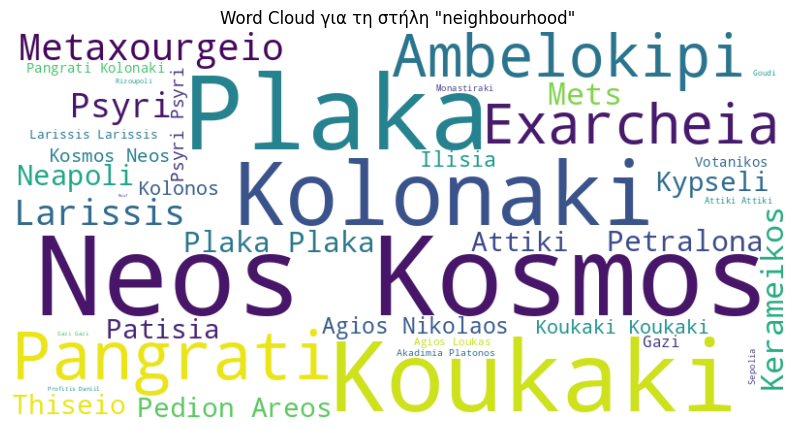

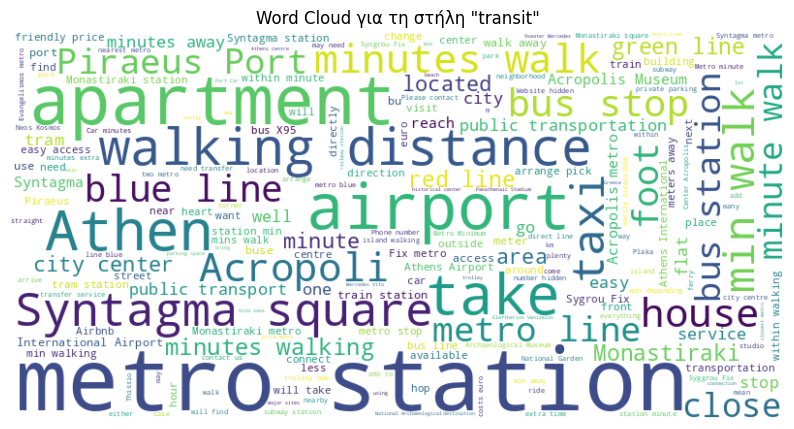

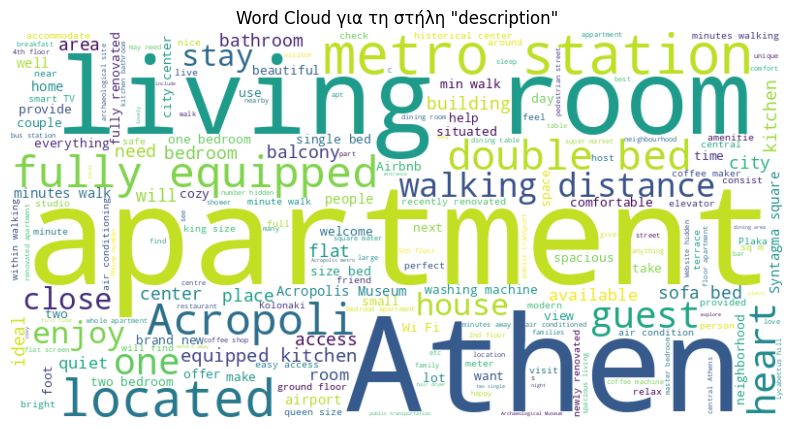

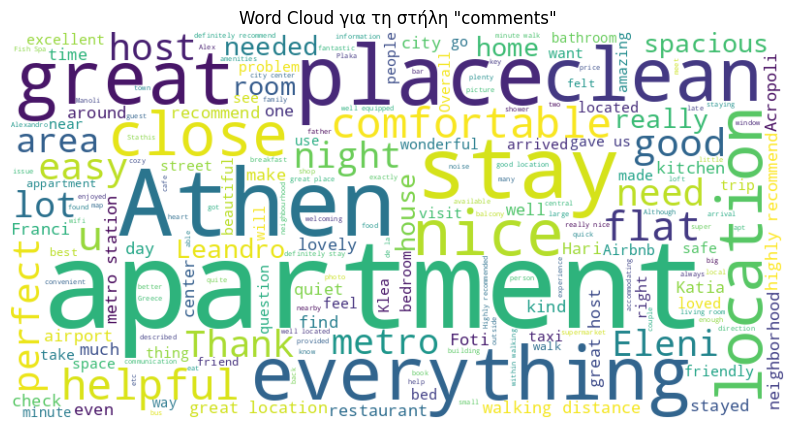


Τα wordclouds του έτους 2023:


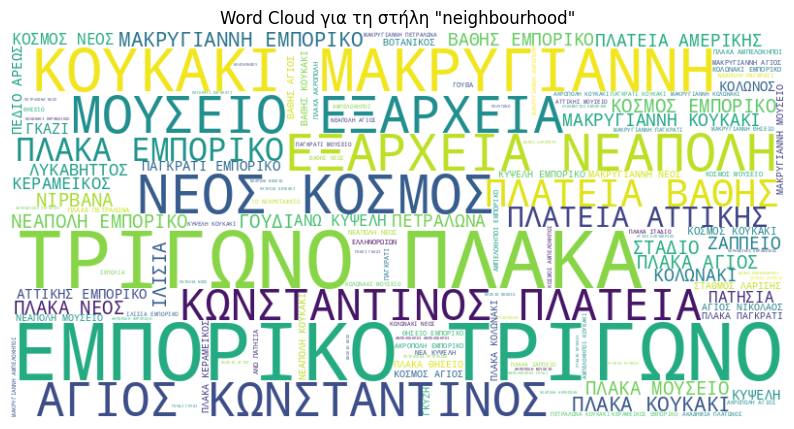

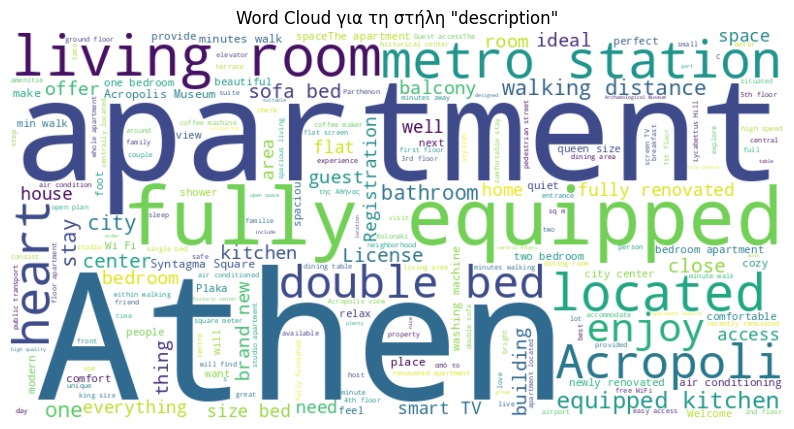

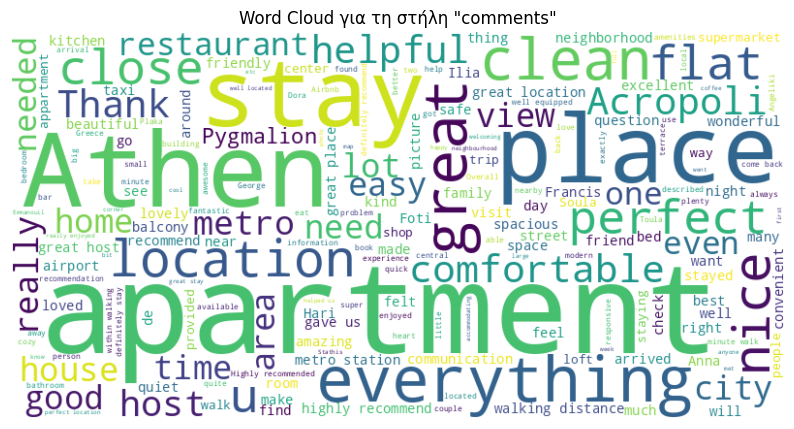


1.11:


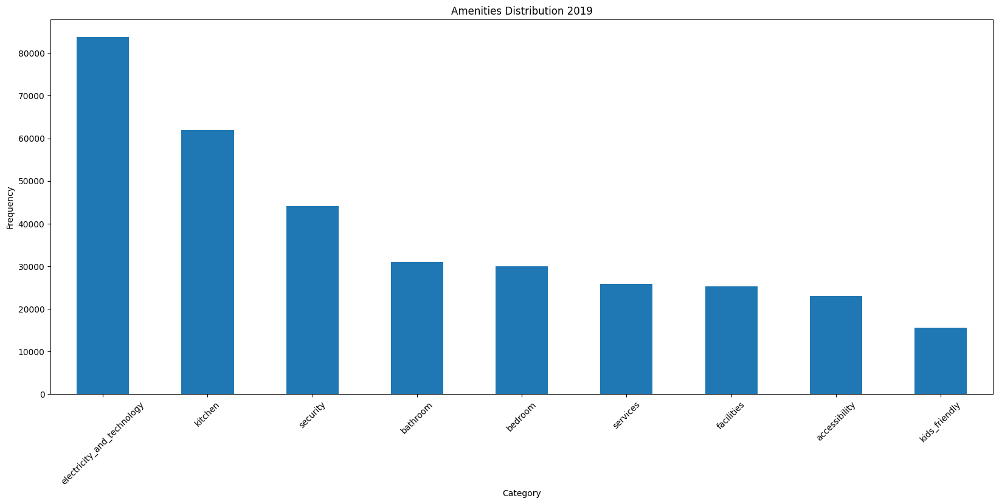

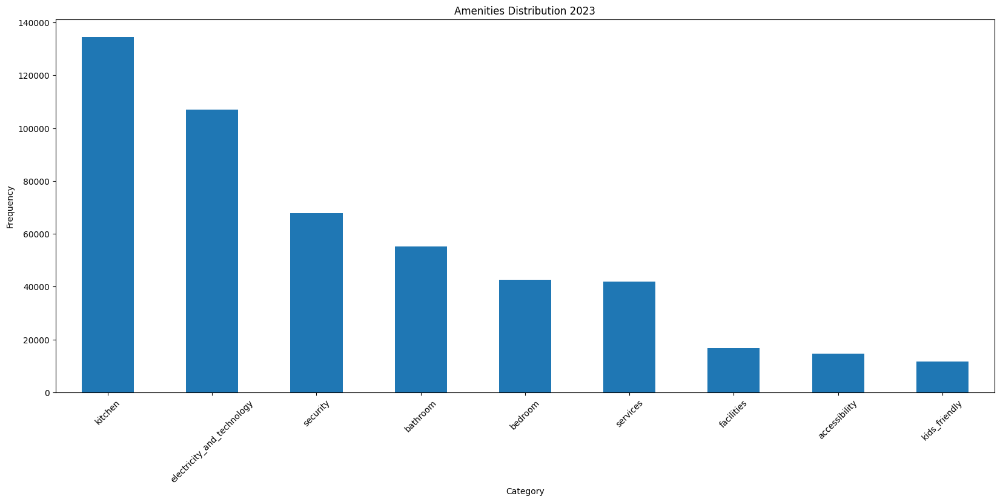

1.12:


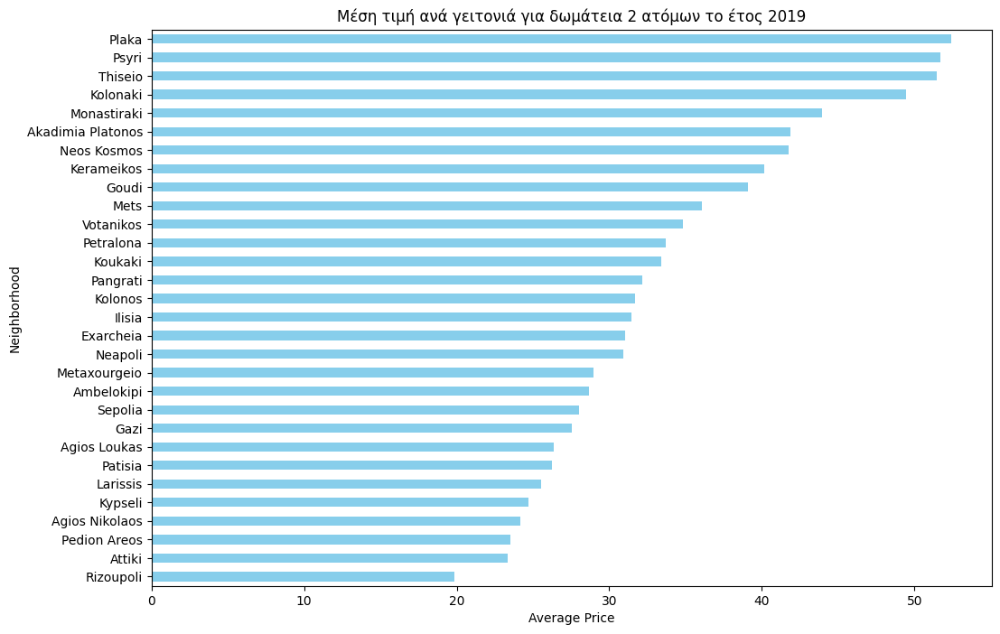

Οικονομικές γειτονιές:
['Rizoupoli', 'Attiki', 'Pedion Areos', 'Agios Nikolaos', 'Kypseli', 'Larissis', 'Patisia', 'Agios Loukas', 'Gazi', 'Sepolia', 'Ambelokipi', 'Metaxourgeio']

Μέτριες γειτονιές:
['Neapoli', 'Exarcheia', 'Ilisia', 'Kolonos', 'Pangrati', 'Koukaki', 'Petralona', 'Votanikos', 'Mets', 'Goudi', 'Kerameikos']

Πολύ Ακριβές γειτονιές:
['Neos Kosmos', 'Akadimia Platonos', 'Monastiraki', 'Kolonaki', 'Thiseio', 'Psyri', 'Plaka']



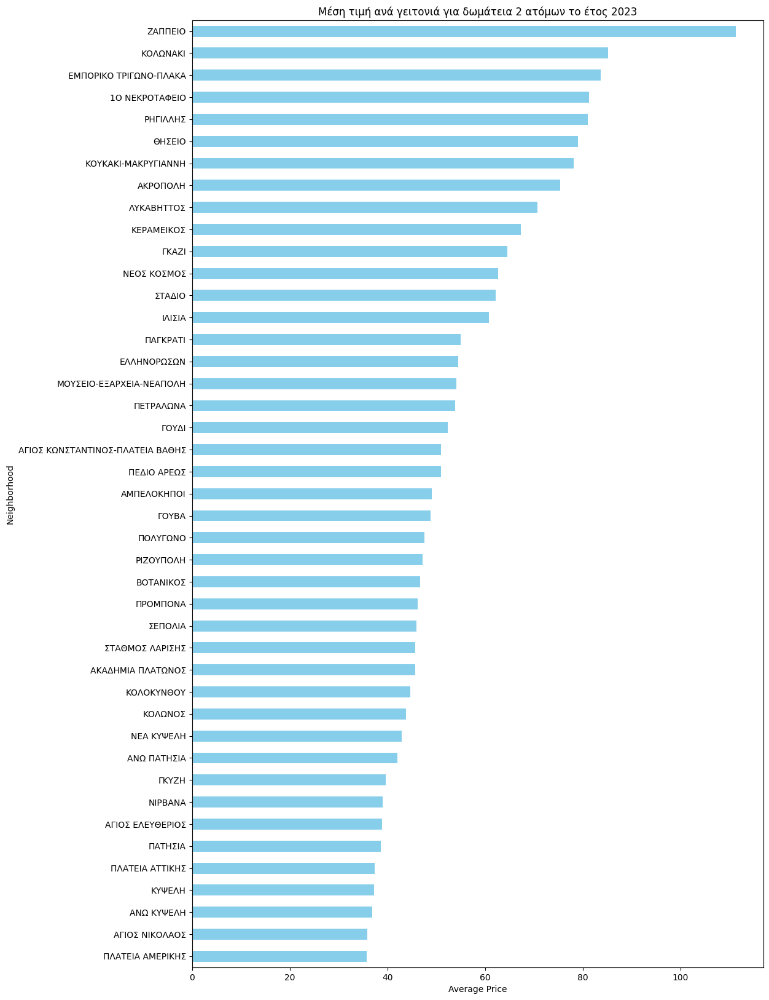

Οικονομικές γειτονιές:
['ΠΛΑΤΕΙΑ ΑΜΕΡΙΚΗΣ', 'ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ', 'ΑΝΩ ΚΥΨΕΛΗ', 'ΚΥΨΕΛΗ', 'ΠΛΑΤΕΙΑ ΑΤΤΙΚΗΣ', 'ΠΑΤΗΣΙΑ', 'ΑΓΙΟΣ ΕΛΕΥΘΕΡΙΟΣ', 'ΝΙΡΒΑΝΑ', 'ΓΚΥΖΗ', 'ΑΝΩ ΠΑΤΗΣΙΑ', 'ΝΕΑ ΚΥΨΕΛΗ', 'ΚΟΛΩΝΟΣ', 'ΚΟΛΟΚΥΝΘΟΥ', 'ΑΚΑΔΗΜΙΑ ΠΛΑΤΩΝΟΣ', 'ΣΤΑΘΜΟΣ ΛΑΡΙΣΗΣ', 'ΣΕΠΟΛΙΑ', 'ΠΡΟΜΠΟΝΑ', 'ΒΟΤΑΝΙΚΟΣ', 'ΡΙΖΟΥΠΟΛΗ', 'ΠΟΛΥΓΩΝΟ', 'ΓΟΥΒΑ', 'ΑΜΠΕΛΟΚΗΠΟΙ', 'ΠΕΔΙΟ ΑΡΕΩΣ', 'ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ', 'ΓΟΥΔΙ', 'ΠΕΤΡΑΛΩΝΑ', 'ΜΟΥΣΕΙΟ-ΕΞΑΡΧΕΙΑ-ΝΕΑΠΟΛΗ', 'ΕΛΛΗΝΟΡΩΣΩΝ', 'ΠΑΓΚΡΑΤΙ', 'ΙΛΙΣΙΑ']

Μέτριες γειτονιές:
['ΣΤΑΔΙΟ', 'ΝΕΟΣ ΚΟΣΜΟΣ', 'ΓΚΑΖΙ', 'ΚΕΡΑΜΕΙΚΟΣ', 'ΛΥΚΑΒΗΤΤΟΣ', 'ΑΚΡΟΠΟΛΗ', 'ΚΟΥΚΑΚΙ-ΜΑΚΡΥΓΙΑΝΝΗ', 'ΘΗΣΕΙΟ', 'ΡΗΓΙΛΛΗΣ', '1Ο ΝΕΚΡΟΤΑΦΕΙΟ', 'ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ', 'ΚΟΛΩΝΑΚΙ']

Πολύ Ακριβές γειτονιές:
['ΖΑΠΠΕΙΟ']

1.13:
Για το έτος 2019:
Η περιοχή με τη υψηλότερη μέση τιμή ανά δωμάτιο:
neighbourhood
Plaka    72.086197
Name: price, dtype: float64

Η περιοχή με τη χαμηλότερη μέση τιμή ανά δωμάτιο:
neighbourhood
Agios Nikolaos    30.111111
Name: price, dtype: float64

Ο μέσος αριθμός δωματίων που διατίθεν

In [4]:
################################################ ΜΕΡΟΣ 1 ##############################################################
# Πριν το τρεξετε τρεξτε το pip install emoji που εχω στο κελι πανω πανω!!!!

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import seaborn as sns
import folium
import sys
import os
import emoji
from bs4 import BeautifulSoup

def remove_emoji(text):
    return emoji.demojize(text, delimiters=("", ""))

def remove_html_tags(text):
    # Έλεγχος αν το κείμενο μοιάζει περισσότερο με όνομα αρχείου
    if '<' in text and '>' in text:
        # Εφαρμογή της BeautifulSoup μόνο αν το κείμενο περιέχει HTML tags
        soup = BeautifulSoup(text, 'html.parser')
        return soup.get_text()
    else:
        return text

concated_2019 = pd.read_csv('concated2019.csv')
concated_2023 = pd.read_csv('concated2023.csv')

######## 1.1 ##########
print("1.1:")
# Για τα δεδομένα του έτους 2019
sns.countplot(data=concated_2019, x='room_type')
plt.title('Room Type Frequencies - 2019')
plt.xlabel('Room Type')
plt.ylabel('Frequency')
plt.show()

# Για τα δεδομένα του έτους 2023
sns.countplot(data=concated_2023, x='room_type')
plt.title('Room Type Frequencies - 2023')
plt.xlabel('Room Type')
plt.ylabel('Frequency')
plt.show()

######### 1.2 #########
print("1.2:")
# Για το έτος 2019
monthly_avg_price_2019 = concated_2019.groupby('month')['price'].mean()

# Σχεδίαση γραφήματος για το έτος 2019
plt.figure(figsize=(10, 6))
plt.plot(monthly_avg_price_2019.index.astype(str), monthly_avg_price_2019.values, marker='o', color='blue')
plt.title('Πορεία των τιμών για το διάστημα των 3 μηνών το 2019')
plt.xlabel('Μήνας')
plt.ylabel('Μέση Τιμή')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Για το έτος 2023
monthly_avg_price_2023 = concated_2023.groupby('month')['price'].mean()

# Εμφάνιση της πορείας των τιμών σε γράφημα γραμμής
plt.figure(figsize=(10, 6))
plt.plot(monthly_avg_price_2023.index, monthly_avg_price_2023.values, marker='o', color='blue')
plt.title('Πορεία των τιμών για το διάστημα των 3 μηνών το 2023')
plt.xlabel('Μήνας')
plt.ylabel('Μέση Τιμή')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

########### 1.3 ############
print("1.3:")
# Για το έτος 2019
top_neighbourhoods_2019 = concated_2019.groupby('neighbourhood')['number_of_reviews'].sum().nlargest(5)
print("Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές για το έτος 2019:")
print(top_neighbourhoods_2019)

# Για το έτος 2023
top_neighbourhoods_2023 = concated_2023.groupby('neighbourhood')['number_of_reviews'].sum().nlargest(5)
print("Οι 5 πρώτες γειτονιές με τις περισσότερες κριτικές για το έτος 2023:")
print(top_neighbourhoods_2023)
print()

########### 1.4 ############
print("1.4:")
# Για το έτος 2019
max_listings_neighbourhood_2019 = concated_2019.groupby('neighbourhood')['id'].count().idxmax()
max_listings_count_2019 = concated_2019.groupby('neighbourhood')['id'].count().max()

print("Η γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων για το έτος 2019 είναι:")
print(max_listings_neighbourhood_2019)
print("με συνολικό αριθμό καταχωρήσεων:", max_listings_count_2019)

# Για το έτος 2023
max_listings_neighbourhood_2023 = concated_2023.groupby('neighbourhood')['id'].count().idxmax()
max_listings_count_2023 = concated_2023.groupby('neighbourhood')['id'].count().max()

print("\nΗ γειτονιά με τις περισσότερες καταχωρήσεις ακινήτων για το έτος 2023 είναι:")
print(max_listings_neighbourhood_2023)
print("με συνολικό αριθμό καταχωρήσεων:", max_listings_count_2023)
print()

########## 1.5 ###########
print("1.5:")
# Για το ετος 2019
# Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και ανά μήνα
listings_per_neighbourhood_month = concated_2019.groupby(['neighbourhood', 'month']).size().unstack()

# Δημιουργία του διαγράμματος
plt.figure(figsize=(15, 8))

# Χρώματα για κάθε μήνα
colors = ['blue', 'green', 'orange']

# Μήνες
months = listings_per_neighbourhood_month.columns

# Πλάτος του κάθε bar
bar_width = 0.25

# Δημιουργία των bars για κάθε περιοχή
for j, month in enumerate(listings_per_neighbourhood_month.columns):
    bar_positions = np.arange(len(listings_per_neighbourhood_month.index)) + j * bar_width
    for i, neighbourhood in enumerate(listings_per_neighbourhood_month.index):
        plt.barh(bar_positions[i], listings_per_neighbourhood_month.loc[neighbourhood, month],
                 height=bar_width, color=colors[j])

# Ορισμός των ετικετών και του τίτλου
plt.ylabel('Περιοχές')
plt.xlabel('Καταχωρήσεις')
plt.title('Καταχωρήσεις ανά γειτονιά και μήνα')
plt.yticks(np.arange(len(listings_per_neighbourhood_month.index)), listings_per_neighbourhood_month.index)
legend_labels = [plt.Rectangle((0,0),1,1, color=color) for color in colors]
plt.legend(legend_labels, months, title='Μήνας')
plt.tight_layout()

# Εμφάνιση του διαγράμματος
plt.show()

# Για το ετος 2023
# Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και ανά μήνα
listings_per_neighbourhood_month = concated_2023.groupby(['neighbourhood', 'month']).size().unstack()

# Δημιουργία του διαγράμματος
plt.figure(figsize=(30, 40))

# Χρώματα για κάθε μήνα
colors = ['blue', 'green', 'orange']

# Μήνες
months = listings_per_neighbourhood_month.columns

# Πλάτος του κάθε bar
bar_width = 0.25

# Δημιουργία των bars για κάθε περιοχή
for j, month in enumerate(listings_per_neighbourhood_month.columns):
    bar_positions = np.arange(len(listings_per_neighbourhood_month.index)) + j * bar_width
    for i, neighbourhood in enumerate(listings_per_neighbourhood_month.index):
        plt.barh(bar_positions[i], listings_per_neighbourhood_month.loc[neighbourhood, month],
                 height=bar_width, color=colors[j])

# Ορισμός των ετικετών και του τίτλου
plt.ylabel('Περιοχές')
plt.xlabel('Καταχωρήσεις')
plt.title('Καταχωρήσεις ανά γειτονιά και μήνα')
plt.yticks(np.arange(len(listings_per_neighbourhood_month.index)), listings_per_neighbourhood_month.index)
legend_labels = [plt.Rectangle((0,0),1,1, color=color) for color in colors]
plt.legend(legend_labels, months, title='Μήνας')
plt.tight_layout()

# Εμφάνιση του διαγράμματος
plt.show()

############ 1.7 #################
print("1.7:")

# Για το έτος 2019
# Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και τύπο δωματίου
room_type_per_neighbourhood = concated_2019.groupby(['neighbourhood', 'room_type']).size()
# Επιλογή του πιο συχνού τύπου δωματίου για κάθε γειτονιά
most_common_room_type_per_neighbourhood = room_type_per_neighbourhood.groupby(level=0).idxmax().apply(lambda x: x[1])
print('Οι πιο συχνοί τύποι δωματίων σε κάθε γειτονιά το έτος 2019:')
print(most_common_room_type_per_neighbourhood)

print()

# Για το έτος 2023
# Ομαδοποίηση των καταχωρήσεων ανά γειτονιά και τύπο δωματίου
room_type_per_neighbourhood = concated_2023.groupby(['neighbourhood', 'room_type']).size()
# Επιλογή του πιο συχνού τύπου δωματίου για κάθε γειτονιά
most_common_room_type_per_neighbourhood = room_type_per_neighbourhood.groupby(level=0).idxmax().apply(lambda x: x[1])
print('Οι πιο συχνοί τύποι δωματίων σε κάθε γειτονιά το έτος 2023:')
print(most_common_room_type_per_neighbourhood)
print()

############ 1.8 #################
print("1.8:")

# Για το έτος 2019
# Ομαδοποίηση των καταχωρήσεων ανά τύπο δωματίου και υπολογισμός της μέσης τιμής
average_price_per_room_type = concated_2019.groupby('room_type')['price'].mean()
# Εύρεση του τύπου δωματίου με τη μέγιστη μέση τιμή
most_expensive_room_type = average_price_per_room_type.idxmax()
print("Ο πιο ακριβός τύπος δωματίου για το έτος 2019 είναι:", most_expensive_room_type)

print()

# Για το έτος 2023
# Ομαδοποίηση των καταχωρήσεων ανά τύπο δωματίου και υπολογισμός της μέσης τιμής
average_price_per_room_type = concated_2023.groupby('room_type')['price'].mean()
# Εύρεση του τύπου δωματίου με τη μέγιστη μέση τιμή
most_expensive_room_type = average_price_per_room_type.idxmax()
print("Ο πιο ακριβός τύπος δωματίου για το έτος 2023 είναι:", most_expensive_room_type)
print()

############ 1.9 #################
print("1.9:")

# Επιλογή μήνα για τον χάρτη
selected_month = 'march'

# Φιλτράρισμα του DataFrame για τον επιλεγμένο μήνα
selected_month_data = concated_2019[concated_2019['month'] == selected_month]

# Δημιουργία του χάρτη
m = folium.Map(location=[selected_month_data['latitude'].mean(), selected_month_data['longitude'].mean()], zoom_start=12)

# Δημιουργία markers για κάθε ακίνητο
for index, row in selected_month_data.iterrows():
    popup_text = f"Name: {row['name']}<br>Room Type: {row['room_type']}<br>Bed Type: {row['bed_type']}<br>Transit: {row['transit']}"
    folium.Marker([row['latitude'], row['longitude']], popup=popup_text).add_to(m)

# Εμφάνιση του χάρτη
display(m)
print()

############ 1.10 #################
print("1.10:")

comments = 'comments'

# Για το έτος 2019
print('Τα wordclouds του έτους 2019:')

columns_10_2019 = ['neighbourhood', 'transit', 'description']
for selected_column in columns_10_2019:
  # Εφαρμογή της συνάρτησης remove_emoji σε κάθε κελί της στήλης "description"
  concated_2019[selected_column] = concated_2019[selected_column].apply(remove_emoji)

  # Συγχώνευση όλων των κειμένων από την επιλεγμένη στήλη σε ένα string
  text = ' '.join(concated_2019[selected_column].dropna())

  # Δημιουργία WordCloud
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

  # Εμφάνιση του WordCloud
  plt.figure(figsize=(10, 6))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.title(f'Word Cloud για τη στήλη "{selected_column}"')
  plt.axis('off')
  plt.show()
  print()

reviews2019 = pd.read_csv('reviews2019.csv')
# Εφαρμογή της συνάρτησης remove_emoji σε κάθε κελί της στήλης "description"
reviews2019[comments] = reviews2019[comments].apply(remove_emoji)

# Συγχώνευση όλων των κειμένων από την επιλεγμένη στήλη σε ένα string
text = ' '.join(reviews2019[comments].dropna())

# Δημιουργία WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Εμφάνιση του WordCloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f'Word Cloud για τη στήλη "{comments}"')
plt.axis('off')
plt.show()
print()

# Για το έτος 2023
print('Τα wordclouds του έτους 2023:')

columns_10_2023 = ['neighbourhood', 'description']
for selected_column in columns_10_2023:
  # Εφαρμογή της συνάρτησης remove_emoji σε κάθε κελί της στήλης "description"
  concated_2023[selected_column] = concated_2023[selected_column].apply(remove_emoji)

  # Αφαίρεση των HTML tags από τα κείμενα στη στήλη "description"
  concated_2023[selected_column] = concated_2023[selected_column].apply(remove_html_tags)

  # Συγχώνευση όλων των κειμένων από την επιλεγμένη στήλη σε ένα string
  text = ' '.join(concated_2023[selected_column].dropna())

  # Δημιουργία WordCloud
  wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

  # Εμφάνιση του WordCloud
  plt.figure(figsize=(10, 6))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.title(f'Word Cloud για τη στήλη "{selected_column}"')
  plt.axis('off')
  plt.show()
  print()

reviews2023 = pd.read_csv('reviews2023.csv')
# Εφαρμογή της συνάρτησης remove_emoji σε κάθε κελί της στήλης "description"
reviews2023[comments] = reviews2023[comments].apply(remove_emoji)

# Αφαίρεση των HTML tags από τα κείμενα στη στήλη "comments" στο DataFrame "reviews2023"
reviews2023[comments] = reviews2023[comments].apply(remove_html_tags)

# Συγχώνευση όλων των κειμένων από την επιλεγμένη στήλη σε ένα string
text = ' '.join(reviews2023[comments].dropna())

# Δημιουργία WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Εμφάνιση του WordCloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f'Word Cloud για τη στήλη "{comments}"')
plt.axis('off')
plt.show()
print()

############# 1.11 ##############
print("1.11:")
# Λίστα με τις κατηγορίες και τις αντίστοιχες τιμές που ανήκουν σε αυτές
categories_11 = {
    'kitchen': ['Breakfast', 'Cooking basics', 'BBQ', 'Grill', 'Oven', 'Coffee maker', 'Microwave', 'Dishwasher', 'Stove', 'Refrigerator', 'Dishes and silverware', 'Full kitchen', 'BBQ grill', 'Convection oven', 'Hot water kettle', 'Mini fridge', 'Espresso machine', 'Double oven', 'Breakfast table'],
    'bedroom': ['Bed liners', 'Extra pillows and blankets', 'Hangers', 'Room-darkening shades', 'Bedroom comforts', 'Firm mattress', 'Memory foam mattress', 'Murphy bed', 'Lock on bedroom door', 'Wide clearance to bed'],
    'bathroom': ['Shampoo', 'Hot water', 'Handheld shower head', 'Bathtub', 'Walk-in shower', 'Bathroom essentials', 'Body soap', 'Bath towel', 'Toilet paper', 'Raining shower'],
    'accessibility': ['Wheelchair accessible', 'Accessible parking', 'Accessible entrance', 'Free parking', 'Step-free access', 'Paid parking on premises', 'Free street parking', 'Accessible-height toilet', 'Accessible-height bed', 'Changing table'],
    'electricity_and_technology': ['TV', 'Cable TV', 'Internet', 'Wifi', 'Hairdryer', 'Ethernet connection', 'Iron', 'Air conditioning', 'Heating', 'DVD player', 'Washer'],
    'facilities': ['Pool', 'Gym', 'Dryer', 'Laptop friendly workspace', 'Elevator', 'Patior or balcony', 'Formal dining area', 'Terrace', 'Balcony', 'Hot tub', 'Outdoor seating'],
    'kids_friendly': ['Children’s books and toys', 'High chair', 'Baby bath', 'Family/kid friendly', 'Crib', "Pack 'n Play/travel crib", 'Babysitter recommendations', 'Window guards'],
    'security': ['Smoke detector', 'Fire extinguisher', 'First aid kit', 'Safety card', 'Essentials', 'Carbon monoxide detector', 'Smart lock', 'Lockbox', 'Fire pit'],
    'services': ['Luggage dropoff allowed', 'Long term stays allowed', '24-hour check-in', 'Cleaning before checkout', 'Self check-in', 'Buzzer/wireless intercom', 'Smoking allowed', 'Pets allowed', 'Doorman']
}
# Συνάρτηση για αντιστοίχιση τιμών σε κατηγορίες
def categorize_amenities(amenities):
    amenities_lower = amenities.lower()  # Μετατροπή όλων των χαρακτήρων σε πεζούς
    amenities_no_quotes = amenities_lower.replace('"', '')  # Αφαίρεση των εισαγωγικών
    amenities_no_brackets = amenities_no_quotes.replace('{', '').replace('}', '')  # Αφαίρεση των αγκυλών

    categories_found = []  # Λίστα για τις κατηγορίες που εντοπίστηκαν

    # Ελέγχει κάθε λέξη του κειμένου για κάθε κατηγορία
    for word in amenities_no_brackets.split(','):
        for category, values in categories_11.items():
            for value in values:
                if value.lower() == word.strip():  # Αφαίρεση πιθανών κενών πριν και μετά τη λέξη
                    categories_found.append(category)  # Προσθήκη κατηγορίας στη λίστα
                    break  # Έξοδος από την εσωτερική βρόχο όταν βρεθεί η κατηγορία

    if categories_found:
        return ','.join(categories_found)  # Επιστροφή όλων των κατηγοριών ως ένα string χωρισμένο με κόμματα
    else:
        return None

# Για το έτος 2019
# Εφαρμογή της συνάρτησης σε όλες τις τιμές της στήλης "amenities"
concated_2019['amenities_category'] = concated_2019['amenities'].apply(categorize_amenities)

# Κατανομή των νέων κατηγοριών
amenities_distribution = concated_2019['amenities_category'].str.split(',').explode().value_counts()

# Εμφάνιση του ιστογράμματος
amenities_distribution.plot(kind='bar', figsize=(20, 8), title='Amenities Distribution 2019')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Για το έτος 2023
# Εφαρμογή της συνάρτησης σε όλες τις τιμές της στήλης "amenities"
concated_2023['amenities_category'] = concated_2023['amenities'].apply(categorize_amenities)

# Κατανομή των νέων κατηγοριών
amenities_distribution = concated_2023['amenities_category'].str.split(',').explode().value_counts()

# Εμφάνιση του ιστογράμματος
amenities_distribution.plot(kind='bar', figsize=(20, 8), title='Amenities Distribution 2023')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

############# 1.12 ##############
print("1.12:")

# Για το έτος 2019

# Δημιουργία των επιπέδων
price_levels = ['Οικονομικές', 'Μέτριες', 'Πολύ Ακριβές']

# Επιλέγουμε μόνο τα δωμάτια που επιτρέπουν τη φιλοξενία δύο ατόμων
rooms_two_guests = concated_2019[concated_2019['accommodates'] == 2]

# Υπολογισμός της μέσης τιμής ανά γειτονιά
neighborhood_avg_price = rooms_two_guests.groupby('neighbourhood')['price'].mean().sort_values()

# Δημιουργία γραφήματος
plt.figure(figsize=(12, 8))
neighborhood_avg_price.plot(kind='barh', color='skyblue')
plt.xlabel('Average Price')
plt.ylabel('Neighborhood')
plt.title('Μέση τιμή ανά γειτονιά για δωμάτεια 2 ατόμων το έτος 2019')
plt.show()

# Υπολογισμός των επιπέδων τιμών
min_price = neighborhood_avg_price.min()
max_price = neighborhood_avg_price.max()

sub = max_price - min_price

# Κατηγοριοποίηση των γειτονιών ανάλογα με τη μέση τιμή τους
neighborhood_avg_price = pd.DataFrame(neighborhood_avg_price)  # Μετατρέπουμε τη σειρά σε DataFrame

# Δημιουργία λίστας για κάθε κατηγορία
economic_neighborhoods = []
moderate_neighborhoods = []
expensive_neighborhoods = []

# Χωρισμός των γειτονιών σε κάθε κατηγορία
for index, row in neighborhood_avg_price.iterrows():
    if row['price'] < min_price + sub/3:
        economic_neighborhoods.append(index)
    elif row['price'] > max_price - sub/3:
        expensive_neighborhoods.append(index)
    else:
        moderate_neighborhoods.append(index)

# Εμφάνιση των γειτονιών ανάλογα με την κατηγορία τους
print("Οικονομικές γειτονιές:")
print(economic_neighborhoods)
print("\nΜέτριες γειτονιές:")
print(moderate_neighborhoods)
print("\nΠολύ Ακριβές γειτονιές:")
print(expensive_neighborhoods)
print()

# Για το έτος 2023
# Επιλέγουμε μόνο τα δωμάτια που επιτρέπουν τη φιλοξενία δύο ατόμων
rooms_two_guests = concated_2023[concated_2023['accommodates'] == 2]

# Υπολογισμός της μέσης τιμής ανά γειτονιά
neighborhood_avg_price = rooms_two_guests.groupby('neighbourhood')['price'].mean().sort_values()

# Δημιουργία γραφήματος
plt.figure(figsize=(12, 20))
neighborhood_avg_price.plot(kind='barh', color='skyblue')
plt.xlabel('Average Price')
plt.ylabel('Neighborhood')
plt.title('Μέση τιμή ανά γειτονιά για δωμάτεια 2 ατόμων το έτος 2023')
plt.show()

# Υπολογισμός των επιπέδων τιμών
min_price = neighborhood_avg_price.min()
max_price = neighborhood_avg_price.max()

sub = max_price - min_price

# Κατηγοριοποίηση των γειτονιών ανάλογα με τη μέση τιμή τους
neighborhood_avg_price = pd.DataFrame(neighborhood_avg_price)  # Μετατρέπουμε τη σειρά σε DataFrame

# Δημιουργία λίστας για κάθε κατηγορία
economic_neighborhoods = []
moderate_neighborhoods = []
expensive_neighborhoods = []

# Χωρισμός των γειτονιών σε κάθε κατηγορία
for index, row in neighborhood_avg_price.iterrows():
    if row['price'] < min_price + sub/3:
        economic_neighborhoods.append(index)
    elif row['price'] > max_price - sub/3:
        expensive_neighborhoods.append(index)
    else:
        moderate_neighborhoods.append(index)

# Εμφάνιση των γειτονιών ανάλογα με την κατηγορία τους
print("Οικονομικές γειτονιές:")
print(economic_neighborhoods)
print("\nΜέτριες γειτονιές:")
print(moderate_neighborhoods)
print("\nΠολύ Ακριβές γειτονιές:")
print(expensive_neighborhoods)
print()

############# 1.13 ##############
print("1.13:")

# Για το έτος 2019
print("Για το έτος 2019:")
# Υψηλότερες και χαμηλότερες μέσες τιμές ανά δωμάτιο στην Αθήνα
highest_avg_price_neighborhood = concated_2019.groupby('neighbourhood')['price'].mean().nlargest(1)
lowest_avg_price_neighborhood = concated_2019.groupby('neighbourhood')['price'].mean().nsmallest(1)

print("Η περιοχή με τη υψηλότερη μέση τιμή ανά δωμάτιο:")
print(highest_avg_price_neighborhood)
print("\nΗ περιοχή με τη χαμηλότερη μέση τιμή ανά δωμάτιο:")
print(lowest_avg_price_neighborhood)

# Πόσα δωμάτια διατίθενται συνήθως για ενοικίαση σε κάθε περιοχή
avg_rooms_per_neighborhood = concated_2019.groupby('neighbourhood')['bedrooms'].mean()
print("\nΟ μέσος αριθμός δωματίων που διατίθενται για ενοικίαση σε κάθε περιοχή:")
print(avg_rooms_per_neighborhood)

# Σχέση μεταξύ μέσης τιμής ενοικίασης και διαθεσιμότητας σε κάθε περιοχή
avg_price_and_availability = concated_2019.groupby('neighbourhood')[['price', 'availability_365']].mean()
print("\nΣχέση μεταξύ μέσης τιμής ενοικίασης και διαθεσιμότητας σε κάθε περιοχή:")
print(avg_price_and_availability)

print()

# Για το έτος 2023
print("Για το έτος 2023:")
# Υψηλότερες και χαμηλότερες μέσες τιμές ανά δωμάτιο στην Αθήνα
highest_avg_price_neighborhood = concated_2023.groupby('neighbourhood')['price'].mean().nlargest(1)
lowest_avg_price_neighborhood = concated_2023.groupby('neighbourhood')['price'].mean().nsmallest(1)

print("Η περιοχή με τη υψηλότερη μέση τιμή ανά δωμάτιο:")
print(highest_avg_price_neighborhood)
print("\nΗ περιοχή με τη χαμηλότερη μέση τιμή ανά δωμάτιο:")
print(lowest_avg_price_neighborhood)

# Πόσα δωμάτια διατίθενται συνήθως για ενοικίαση σε κάθε περιοχή
avg_rooms_per_neighborhood = concated_2023.groupby('neighbourhood')['bedrooms'].mean()
print("\nΟ μέσος αριθμός δωματίων που διατίθενται για ενοικίαση σε κάθε περιοχή:")
print(avg_rooms_per_neighborhood)

# Σχέση μεταξύ μέσης τιμής ενοικίασης και διαθεσιμότητας σε κάθε περιοχή
avg_price_and_availability = concated_2023.groupby('neighbourhood')[['price', 'availability_365']].mean()
print("\nΣχέση μεταξύ μέσης τιμής ενοικίασης και διαθεσιμότητας σε κάθε περιοχή:")
print(avg_price_and_availability)
print()

############### 1.14 ################
print('1.14:')

print('Για το ετος 2019:')
# Υπολογισμός πόσα ακίνητα έχει κάθε host_id
num_host_listings = concated_2019['host_id'].value_counts()

# Επιλογή των δέκα hosts με τα περισσότερα ακίνητα
top_10_hosts = num_host_listings.head(10)

# Δημιουργία DataFrame με τα αποτελέσματα
top_hosts_df = pd.DataFrame({'host_id': top_10_hosts.index, 'num_host_listings': top_10_hosts.values})

# Εμφάνιση του πίνακα με τους δέκα hosts με τα περισσότερα ακίνητα
print(top_hosts_df)
print()

print('Για το ετος 2023:')
# Υπολογισμός πόσα ακίνητα έχει κάθε host_id
num_host_listings = concated_2023['host_id'].value_counts()

# Επιλογή των δέκα hosts με τα περισσότερα ακίνητα
top_10_hosts = num_host_listings.head(10)

# Δημιουργία DataFrame με τα αποτελέσματα
top_hosts_df = pd.DataFrame({'host_id': top_10_hosts.index, 'num_host_listings': top_10_hosts.values})

# Εμφάνιση του πίνακα με τους δέκα hosts με τα περισσότερα ακίνητα
print(top_hosts_df)
print()

############### 1.15 ################
print('1.15:')
print('Παρατηρηθηκε οτι οι τιμες απο το 2019 στο 2023 εχουν αυξηθει αρκετα στην μεση τιμη τους.')
print('Τα περισσοτερα Airbnb ειναι και στις 2 χρονιες σπιτια/διαμερισματα, παρολα αυτα το 2023 ηταν πιο ακριβα τα Δωματεια ξενοδοχειων παρα τα διαμερισματα/σπιτια σε αντιθεση με το 2019.')
print('Οι ακριβοτερες περιοχες εχουν αλλαξει, αφου το 2019 η ακριβοτερη ηταν η Πλακα, ενω το 2023 η ακριβοτερη ηταν το Ζαππειο.')
print('Παρολα αυτα καποιες περιοχες που ηταν φθηνες το 2019 οπως η Κυψελη ή ο Αγιος Νικολαος εμειναν φθηνες και το 2023.')
print('Καποιες αλλες οπως η Πλακα ή το Κολονακι παρεμειναν ακριβες περιοχες και στις 2 χρονιες.')
print('Αλλες ομως, οπως η Ψυρρη ενω το 2019 ηταν ακριβες το 2023 επεσε η μεση τιμη τους τουλαχιστον στα διαμερισματα 2 ατομων.')
print('Το 2023 παρατηρουνται περισσοτερες γειτονιες απο οτι το 2019. Επισης υπαρχουν αλλα ονοματα γειτονιων.')
print('Οι ανεσεις που προσφερονται στραφηκαν περισσοτερο στο θεμα της κουζινας το ετος 2023 και οχι τοσο στην τεχνολογια και τις συσκευες σε αντιθεση με το 2019.')
print('Επισης, το 2023 παρατηρηθηκε οτι οι ιδιωτες εχουν στην κατοχη τους περισσοτερα ακινητα κατα μεσο ορο σε συγκριση με το 2019.')
print('Και τις δυο χρονιες οπως αναμενοταν οι τιμες αυξανονται οσο πλησιαζουν οι περιοδοι διακοπων, οπως καλοκαιρι, χριστουγεννα ή πασχα.')


In [5]:
################################################ ΜΕΡΟΣ 2 ##############################################################

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import string
import re

required_columns_2 = ['id', 'name', 'description']

concated_2019 = pd.read_csv('train_2019.csv')[required_columns_2]

concated_2019.drop_duplicates(subset='id', inplace=True)

concated_2019['description'] = concated_2019['description'].str.replace("\"", '')

# Αφαιρούμε τους αριθμούς από το κείμενο
concated_2019['description'] = concated_2019['description'].apply(lambda x: re.sub(r'\b\d+\b', '', str(x)))

# Κατεβάζουμε τα stop words
nltk.download('punkt')
nltk.download('stopwords')

# Αποθηκεύουμε τα αγγλικά και ελληνικά stop words σε μία λίστα
english_stop_words = set(stopwords.words('english'))
greek_stop_words = set(stopwords.words('greek'))

# Συνδυάζουμε τις λίστες stop words
all_stop_words = english_stop_words.union(greek_stop_words)
all_stop_words = all_stop_words.union(set(string.punctuation + '\'' + '\"' + '’' + '“' + '”'))

# Αφαιρούμε τα stop words από το κείμενο της στήλης "description"
concated_2019['description'] = concated_2019['description'].apply(lambda x: ' '.join([word for word in word_tokenize(str(x)) if word.lower() not in all_stop_words]))

# Συνάρτηση για ένωση των στηλών 'name' και 'description'
def concatenate_columns(row):
    name = str(row['name']) if pd.notnull(row['name']) else ''  # Μετατροπή σε string και αντικατάσταση NaN με κενό
    description = str(row['description']) if pd.notnull(row['description']) else ''  # Μετατροπή σε string και αντικατάσταση NaN με κενό
    split = '{{}}'
    return name + split + description  # Ένωση των δύο στηλών με ένα κενό σαν διαχωριστικό

# Δημιουργία της νέας στήλης με την ένωση των στηλών 'name' και 'description'
concated_2019['name_description'] = concated_2019.apply(concatenate_columns, axis=1)

# Κάνουμε drop τις στήλες "name" και "description" από το DataFrame
concated_2019.drop(['name', 'description'], axis=1, inplace=True)

# Επιλογή τυχαίου δείγματος του 5% των δεδομένων
percent = 0.5
random_sample = concated_2019.sample(frac=percent, random_state=42)  # Ορίζουμε το seed για αναπαραγωγή των αποτελεσμάτων

################ 2.1 ###################
# Δημιουργία ενός αντικειμένου TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2), stop_words='english')

# Εκπαίδευση του vectorizer και μετατροπή των κειμένων σε TF-IDF προγράμματα
tfidf_matrix = tfidf_vectorizer.fit_transform(random_sample['name_description'])

################ 2.2 ###################
# Υπολογισμός της ομοιότητας Cosine Similarity μεταξύ όλων των ακινήτων
cosine_similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)

# Δημιουργία ενός λεξικού για να αποθηκεύσουμε τα 100 πιο όμοια ακίνητα για κάθε ακίνητο
top_similar_properties = {}

# Διατρέξτε κάθε ακίνητο
for i, property_id in enumerate(random_sample['id']):
    # Βρείτε τις ομοιότητες Cosine Similarity για το τρέχον ακίνητο
    similarity_scores = list(enumerate(cosine_similarities[i]))
    # Ταξινομήστε τις ομοιότητες με φθίνουσα σειρά
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    # Αποθηκεύστε τα 100 πιο όμοια ακίνητα στο λεξικό
    top_similar_properties[property_id] = similarity_scores[1:101]  # Αφαιρούμε τον εαυτό του από τη λίστα

# # Εκτύπωση του λεξικού με τα 100 πιο όμοια ακίνητα για κάθε ακίνητο
# for property_id, similar_properties in top_similar_properties.items():
#     print(f"Property ID: {property_id}")
#     for i, (similar_property_id, similarity_score) in enumerate(similar_properties):
#         print(f"\tSimilar Property ID: {random_sample.iloc[similar_property_id]['id']}, Similarity Score: {similarity_score}")
#         if i == 4:  # Εκτυπώνουμε μόνο τα 5 πρώτα πιο όμοια ακίνητα για κάθε ακίνητο
#             break

################ 2.3 ###################
def recommend(item_id, num):
    if num < 1 or num > 100:
        print('Enter a valid number')
        return

    # Βρείτε τα πιο όμοια ακίνητα για το δοσμένο item_id από το λεξικό top_similar_properties
    similar_properties = top_similar_properties.get(item_id)

    if similar_properties is None:
        print(f"No similar properties found for item with ID: {item_id}")
        print()
        return

    print(f"Recommending {num} listings similar to Property ID: {item_id}")
    print("-" * 60)

    # Εκτυπώστε τα πρώτα num πιο όμοια ακίνητα
    for i, (similar_property_id, similarity_score) in enumerate(similar_properties[:num]):
        nd = random_sample.iloc[similar_property_id]['name_description']
        name, description = nd.split('{{}}')
        print(f"Recommended: {name}")
        print(f"Description: {description}")
        print(f"(score: {similarity_score})")
        if i == num - 1:
            break
        print()
    print()

recommend(11111111, 4)  # Δεν υπαρχει...
recommend(16012573, 4)
recommend(27108248, 2)
recommend(33705147, 4)

################ 2.4 ###################
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

random_sample['name_description'] = random_sample['name_description'].str.replace('{{}}', ' ')

# Φτιάξτε μια λίστα με τις λέξεις του κειμένου σας
word_list = [word for text in random_sample['name_description'] for word in text.split()]

# Δημιουργήστε ένα BigramCollocationFinder
bigram_finder = BigramCollocationFinder.from_words(word_list)

# Επιλέξτε τους 10 συχνότερους συνδυασμούς με βάση τον συντελεστή PMI
top_10_collocations = bigram_finder.nbest(BigramAssocMeasures.pmi, 10)

print("Top 10 Collocations:")
for collocation in top_10_collocations:
    print(collocation)



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


No similar properties found for item with ID: 11111111

Recommending 4 listings similar to Property ID: 16012573
------------------------------------------------------------
Recommended: Elegant, fully equipped apt under the Acropolis
Description: looking top location apartment located Acropolis area right next Acropolis Museum m. Acropolis Metro Station main Athenian landmarks short walking distance Archaeological sites Museums National Gardens Syntagma parliament Sq. Shopping Dining Nightlife walking distance apartment fully renovated fully equipped Ideal families Business Relaxing Apartment sq.m including entrance hall living room one bedroom bathroom fully equipped kitchen refrigerator stove oven dishwasher washer/dryer microwave oven coffee maker etc. living room bedroom fully air-conditioned living room totally separated rest apartment extra guests disturbed Suitable families small children babies Crib orthopedic mattress linens provided access space
(score: 0.08019632491518461)
